In [1]:
!pip install azure-cognitiveservices-vision-computervision
!pip install pillow
!pip install azure-ai-vision-imageanalysis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.9/198.9 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.2/64.2 kB 4.1 MB/s eta 0:00:00


In [2]:
from azure.cognitiveservices.vision.computervision import ComputerVisionClient
from azure.cognitiveservices.vision.computervision.models import OperationStatusCodes
from azure.cognitiveservices.vision.computervision.models import VisualFeatureTypes
from azure.ai.vision.imageanalysis.models import VisualFeatures

from msrest.authentication import CognitiveServicesCredentials
from array import array
import os
from PIL import Image
import sys
import time
import matplotlib.pyplot as plt
from skimage import io
import numpy as np

In [15]:
'''
Authenticate
Authenticates your credentials and creates a client.
'''
subscription_key ="7ZVdlcW5yyIio6y1p58WEJEWFMG1H595SrhHmyvFW4PXAagdvi5AJQQJ99BCACi5YpzXJ3w3AAAFACOGU3tq"
endpoint ="https://lab4ainame.cognitiveservices.azure.com/"
computervision_client = ComputerVisionClient(endpoint, CognitiveServicesCredentials(subscription_key))
'''
END - Authenticate
'''

'\nEND - Authenticate\n'

<ipython-input-20-7b447ec70169>:47: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


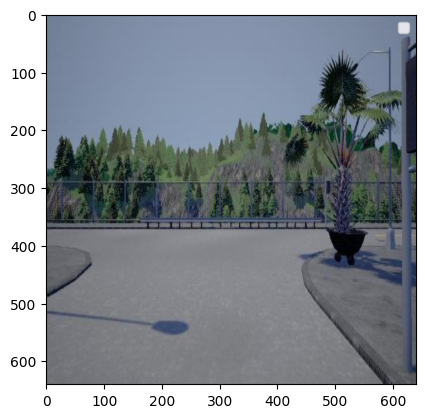

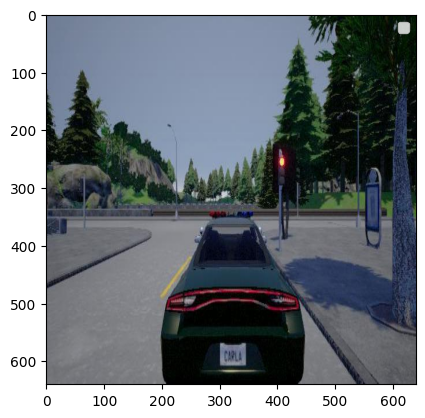

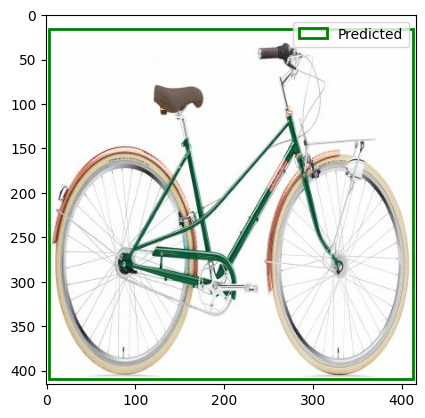

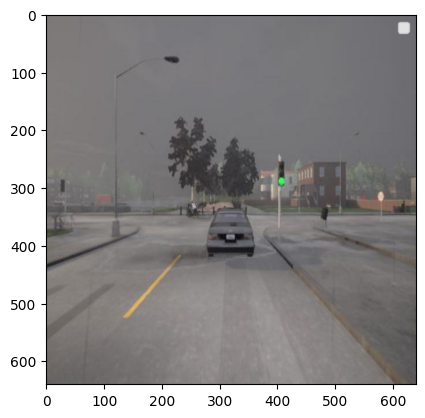

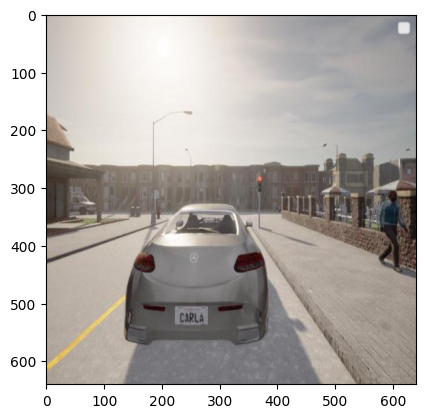

...

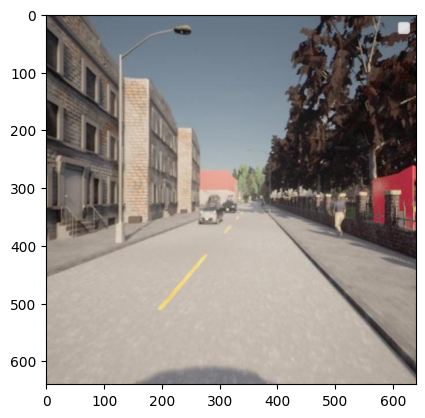

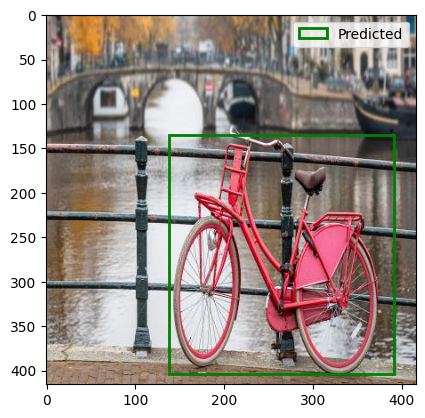

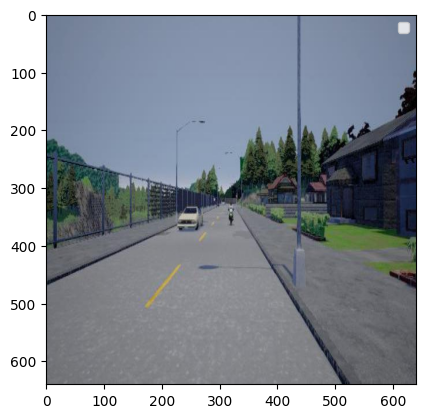

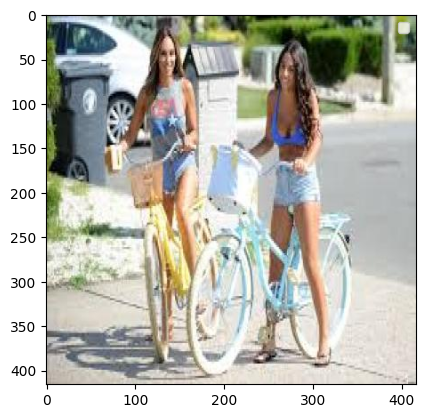

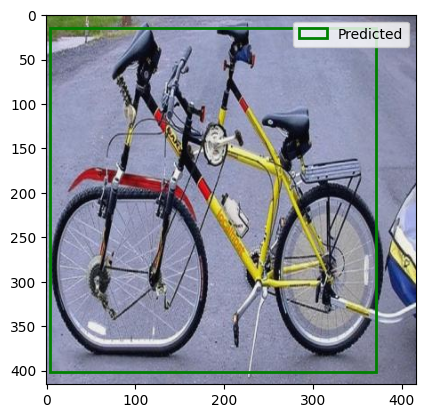

In [20]:
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from azure.cognitiveservices.vision.computervision.models import VisualFeatureTypes

# Folderul cu imaginile
directory = "images"

# Iterează prin toate fișierele din folder
for filename in os.listdir(directory):

    time.sleep(5)
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        img_path = os.path.join(directory, filename)
        img = open(img_path, "rb")

        # Analizează imaginea
        result = computervision_client.analyze_image_in_stream(img, visual_features=[VisualFeatureTypes.objects])

        predicted_bike = None
        for ob in result.objects:
            if ob.object_property == "bicycle":
                predicted_bike = [
                    ob.rectangle.x,
                    ob.rectangle.y,
                    ob.rectangle.x + ob.rectangle.w,
                    ob.rectangle.y + ob.rectangle.h
                ]
                break  # Găsim doar prima bicicletă detectată

        # Citește imaginea
        im = plt.imread(img_path)
        fig, ax = plt.subplots()
        ax.imshow(im)

        # Desenează bounding box-ul prezis (verde)
        if predicted_bike:
            rect_pred = patches.Rectangle(
                (predicted_bike[0], predicted_bike[1]),
                predicted_bike[2] - predicted_bike[0],
                predicted_bike[3] - predicted_bike[1],
                linewidth=2, edgecolor="green", facecolor="none", label="Predicted"
            )
            ax.add_patch(rect_pred)

        # Adaugă legenda și afișează imaginea
        plt.legend()
        plt.show()


In [24]:
def evalClassificationV1(realLabels, computedLabels, labelNames):
    from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score

    cm = confusion_matrix(realLabels, computedLabels, labels = labelNames)
    acc = accuracy_score(realLabels, computedLabels)
    precision = precision_score(realLabels, computedLabels, average = None, labels = labelNames)
    recall = recall_score(realLabels, computedLabels, average = None, labels = labelNames)
    return acc, precision, recall

def biciclete_in_imagini():
    import cv2
    import os
    import matplotlib.pyplot as plt
    from math import sqrt

    ground_truth = ["bike","bike","bike","bike","bike","bike","bike","bike","bike","bike","no-bike","no-bike","no-bike","no-bike","no-bike","no-bike","no-bike","no-bike","no-bike","no-bike"]
    prediction = []

    director_imagini = "images"
    imagini = []
    nr_imagini_cu_bicicleta = 0
    nr_imagini_fara_bicicleta = 0

    for nume_fisier in os.listdir(director_imagini):
        cale_fisier = os.path.join(director_imagini, nume_fisier)

        # Verificăm dacă fișierul este o imagine
        if os.path.isfile(cale_fisier) and any(cale_fisier.endswith(extensie) for extensie in [".jpg", ".jpeg", ".png"]):
            # Adăugăm calea către imagine în listă
            imagini.append(cale_fisier)

    for imagine_path in imagini:
        img = open(imagine_path, "rb")
        result = computervision_client.analyze_image_in_stream(img, visual_features=[VisualFeatureTypes.objects])

        print(f"Analizând imaginea: {imagine_path}")
        found_bicycle = False

        for ob in result.objects:
            if ob.object_property == "bicycle":
                predicted_bicycle_bb = [ob.rectangle.x, ob.rectangle.y, ob.rectangle.x + ob.rectangle.w, ob.rectangle.y + ob.rectangle.h]
                found_bicycle = True
                break

        if found_bicycle:
            print("Bicicletă găsită în imagine.", predicted_bicycle_bb)
            nr_imagini_cu_bicicleta += 1
            prediction.append("bike")
        else:
            print("Nu s-a găsit bicicletă în imagine.")
            nr_imagini_fara_bicicleta += 1
            prediction.append("no-bike")

    print()
    print("Total imagini biciclete prezise: ", nr_imagini_cu_bicicleta)
    print("Total imagini biciclete: ", 10)
    err = (sqrt((nr_imagini_cu_bicicleta - 10)**2))/2
    print("Eroare de: ", err)
    print()
    print("Total imagini fara biciclete prezise: ", nr_imagini_fara_bicicleta)
    print("Total imagini fara biciclete: ", 10)
    err = (sqrt((nr_imagini_fara_bicicleta - 10)**2))/2
    print("Eroare de: ", err)
    print()
    print("Ground truth:", ground_truth)
    print("Prediction: ", prediction)
    acc, prec, recall = evalClassificationV1(ground_truth, prediction, ['bike', 'no-bike'])
    #recall = true poz / (true poz + false neg)
    #precision = true poz / (true poz + false poz)
    print('acc: ', acc, ' precision: ', prec, ' recall: ', recall)

biciclete_in_imagini()

Analizând imaginea: images/traffic09.jpg
Nu s-a găsit bicicletă în imagine.
Analizând imaginea: images/traffic10.jpg
Nu s-a găsit bicicletă în imagine.
Analizând imaginea: images/bike1.jpg
Bicicletă găsită în imagine. [3, 16, 412, 410]
Analizând imaginea: images/traffic06.jpg
Nu s-a găsit bicicletă în imagine.
Analizând imaginea: images/traffic01.jpg
Nu s-a găsit bicicletă în imagine.
Analizând imaginea: images/bike04.jpg
Bicicletă găsită în imagine. [0, 2, 414, 412]
Analizând imaginea: images/bike05.jpg
Bicicletă găsită în imagine. [66, 36, 349, 335]
Analizând imaginea: images/bike07.jpg
Bicicletă găsită în imagine. [51, 206, 308, 416]
Analizând imaginea: images/traffic07.jpg
Nu s-a găsit bicicletă în imagine.
Analizând imaginea: images/traffic05.jpg
Nu s-a găsit bicicletă în imagine.
Analizând imaginea: images/bike03.jpg
Bicicletă găsită în imagine. [155, 153, 338, 405]
Analizând imaginea: images/bike08.jpg
Nu s-a găsit bicicletă în imagine.
Analizând imaginea: images/traffic02.jpg
N

In [4]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def classify_image(image_path):
    with open(image_path, "rb") as image_contents:
        results = computervision_client.analyze_image_in_stream(image_contents, visual_features=[VisualFeatureTypes.tags])
        return results.tags

# Functia pentru a determina daca o imagine conține o bicicleta
def contains_bicycle(tags):
    for tag in tags:
        if tag.name == "bicycle":
            return True
    return False

# Functia pentru evaluarea performantei clasificatorului
def evaluate_classifier(predictions, true_labels):
    accuracy = accuracy_score(true_labels, predictions)
    precision = precision_score(true_labels, predictions)
    recall = recall_score(true_labels, predictions)
    return accuracy, precision, recall

# Exemplu de utilizare
# Verificati toate imaginile din directorul /images
image_dir = "images"
image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir) if fname.lower().endswith(('png', 'jpg', 'jpeg'))]

true_labels = []
predictions = []
for img in image_paths:
  if "bike" in img:
    true_labels.append(1)
  else:
    true_labels.append(0)

for image_path in image_paths:
    tags = classify_image(image_path)
    prediction = contains_bicycle(tags)
    if prediction:
      print("Image ",image_path," contains a bicycle ")
    else:
      print("Image ",image_path," does not contain a bicycle ")
    predictions.append(prediction)

# Evaluati performanta clasificatorului
accuracy, precision, recall = evaluate_classifier(predictions, true_labels)
print(f"Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}")

Image  images/traffic09.jpg  does not contain a bicycle 
Image  images/traffic10.jpg  does not contain a bicycle 
Image  images/bike1.jpg  contains a bicycle 
Image  images/traffic06.jpg  does not contain a bicycle 
Image  images/traffic01.jpg  does not contain a bicycle 
Image  images/bike04.jpg  contains a bicycle 
Image  images/bike05.jpg  contains a bicycle 
Image  images/bike07.jpg  contains a bicycle 
Image  images/traffic07.jpg  does not contain a bicycle 
Image  images/traffic05.jpg  does not contain a bicycle 
Image  images/bike03.jpg  contains a bicycle 
Image  images/bike08.jpg  contains a bicycle 
Image  images/traffic02.jpg  does not contain a bicycle 
Image  images/traffic03.jpg  does not contain a bicycle 
Image  images/bike02.jpg  contains a bicycle 
Image  images/traffic04.jpg  does not contain a bicycle 
Image  images/bike10.jpg  contains a bicycle 
Image  images/traffic08.jpg  does not contain a bicycle 
Image  images/bike06.jpg  contains a bicycle 
Image  images/bik

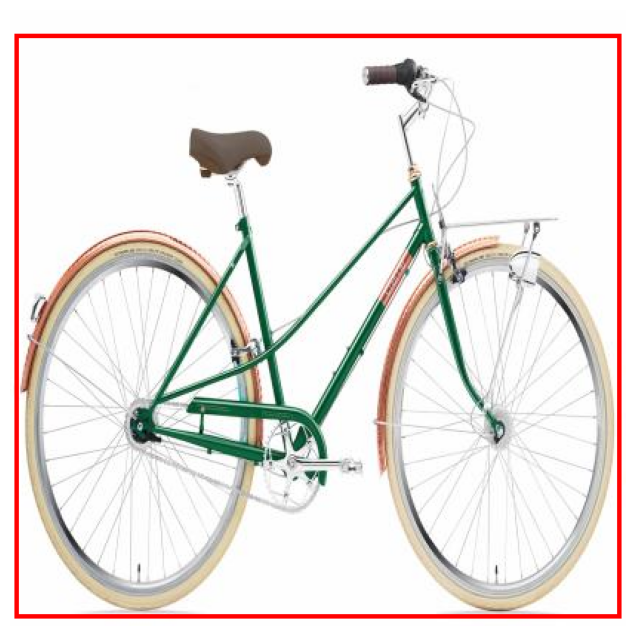

Processed images/bike1.jpg with 1 bicycles detected.


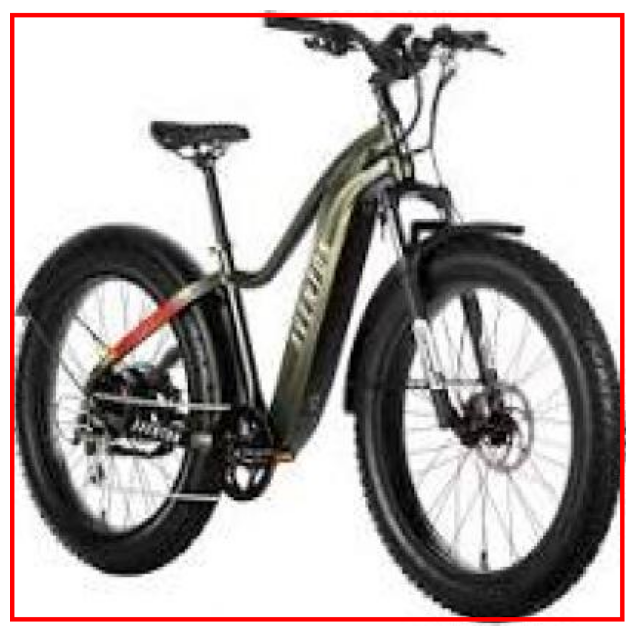

Processed images/bike04.jpg with 1 bicycles detected.


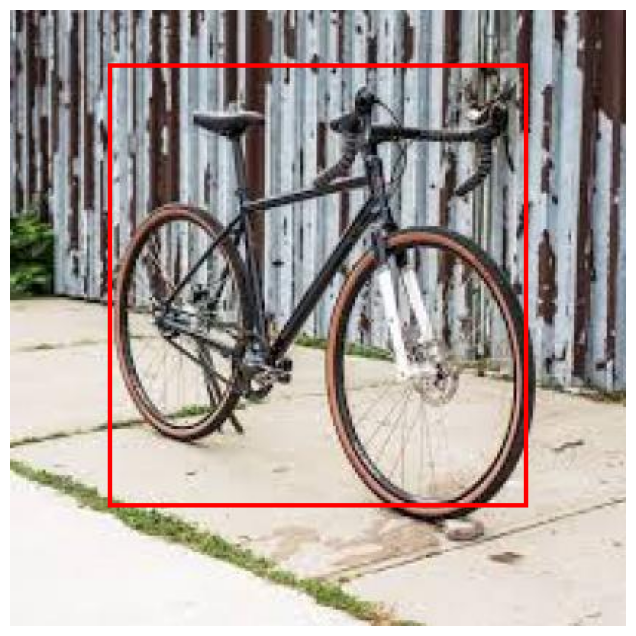

Processed images/bike05.jpg with 1 bicycles detected.


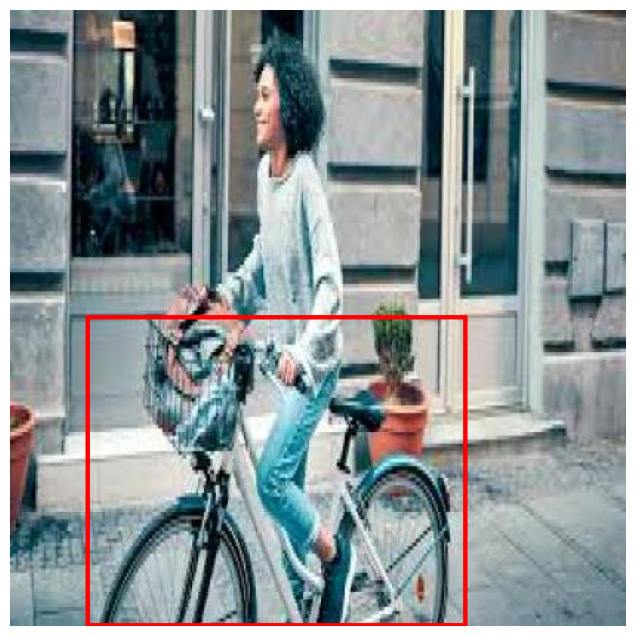

Processed images/bike07.jpg with 1 bicycles detected.


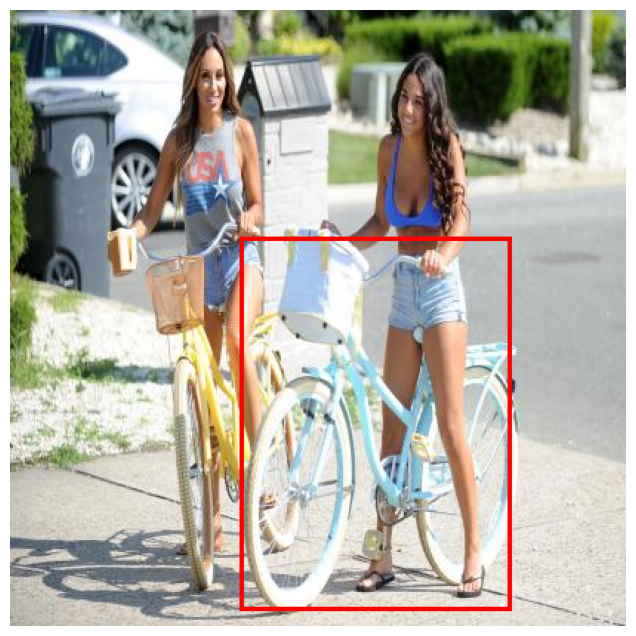

Processed images/bike03.jpg with 1 bicycles detected.


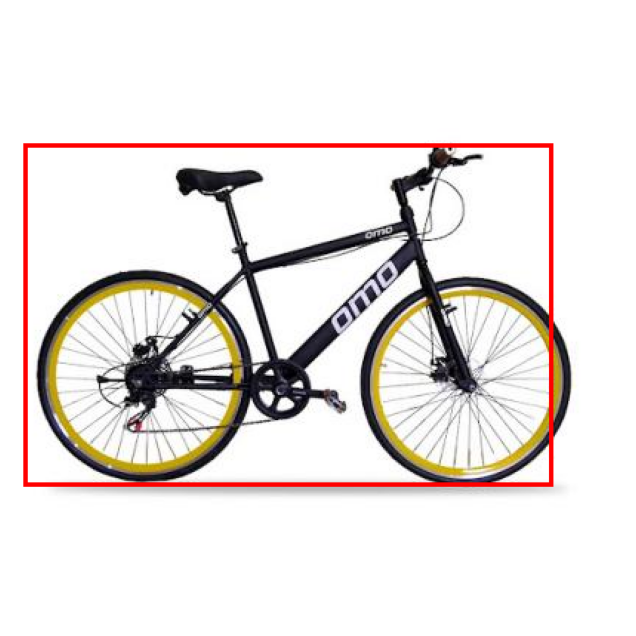

Processed images/bike02.jpg with 1 bicycles detected.


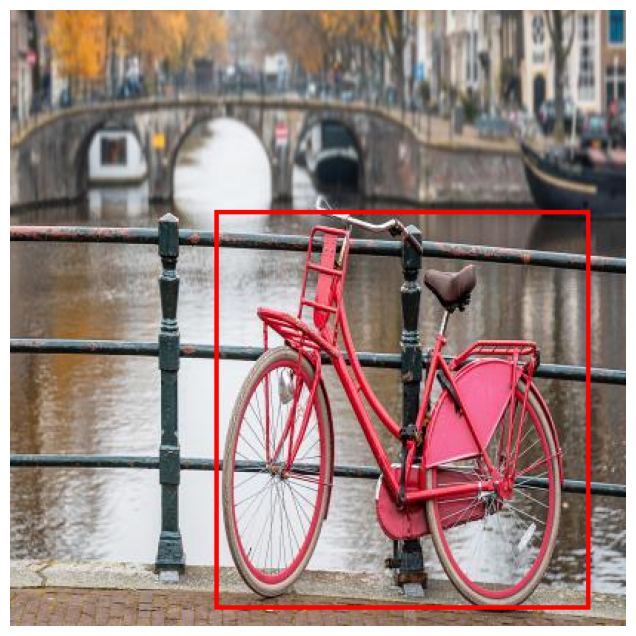

Processed images/bike10.jpg with 1 bicycles detected.


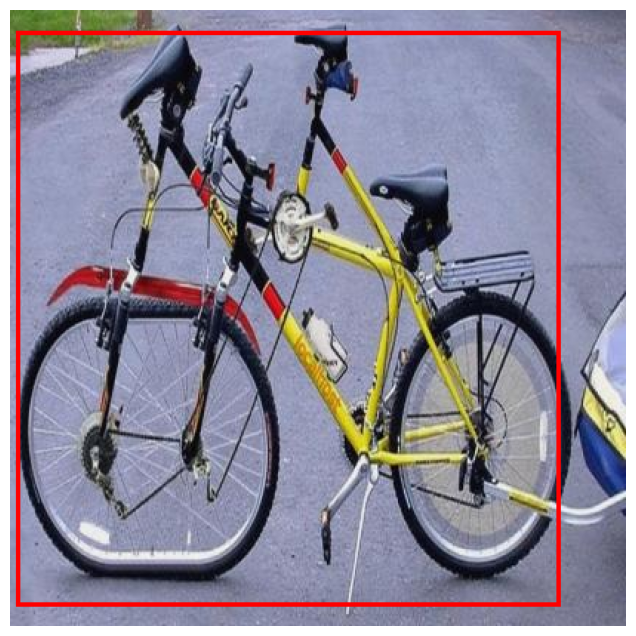

Processed images/bike09.jpg with 1 bicycles detected.


In [29]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

def detect_bicycles(image_path):
    time.sleep(5)
    with open(image_path, "rb") as image_contents:
        results = computervision_client.detect_objects_in_stream(image_contents)
        return [obj for obj in results.objects if obj.object_property == "bicycle"]

# Funcția pentru desenarea chenarelor în jurul bicicletelor
def draw_boxes(image_path, detected_objects):
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)
    for obj in detected_objects:
        box = obj.rectangle
        left = box.x
        top = box.y
        right = box.x + box.w
        bottom = box.y + box.h
        draw.rectangle([left, top, right, bottom], outline="red", width=3)
    return image

# Funcția pentru afișarea imaginii cu chenare
def display_image_with_boxes(image):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

image_dir = "images"
image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir) if fname.lower().endswith(('png', 'jpg', 'jpeg'))]

for image_path in image_paths:
    detection_results = detect_bicycles(image_path)
    if detection_results:
        image_with_boxes = draw_boxes(image_path, detection_results)
        display_image_with_boxes(image_with_boxes)
        print(f"Processed {image_path} with {len(detection_results)} bicycles detected.")

In [10]:
import os
import cv2
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

def detect_bicycles_boxes(image_path):
    time.sleep(4)
    """Returnează doar coordonatele bounding box-urilor bicicletelor detectate."""
    with open(image_path, "rb") as image_contents:
        results = computervision_client.detect_objects_in_stream(image_contents)

        # Extragem doar bicicletele și returnăm coordonatele sub formă de listă de dict-uri
        bicycles = {}
        for obj in results.objects:
            if obj.object_property == "bicycle":
                box = obj.rectangle
                image_name=os.path.basename(image_path)
                if image_name not in bicycles:
                    bicycles[image_name]=[]
                bicycles[image_name].append({
                    "x1": box.x,
                    "y1": box.y,
                    "x2": box.x + box.w,
                    "y2": box.y + box.h
                })
        return bicycles  # Doar coordonatele, fără imagini


def manual_label_boxes():
    return {
        "bike1.jpg": [{"x1": 8, "y1": 33, "x2": 406, "y2": 406}],
        "bike02.jpg": [{"x1": 16, "y1": 90, "x2": 375, "y2": 320}],
        "bike03.jpg": [{"x1": 155, "y1": 145, "x2": 345, "y2": 410},{"x1": 65, "y1": 140, "x2": 200, "y2": 390}],
        "bike04.jpg": [{"x1": 3, "y1": 3, "x2": 410, "y2": 410}],
        "bike05.jpg": [{"x1": 65, "y1": 55, "x2": 355, "y2": 345}],
        "bike06.jpg": [{"x1": 155, "y1": 145, "x2": 345, "y2": 410},{"x1": 65, "y1": 140, "x2": 200, "y2": 390}],
        "bike07.jpg": [{"x1": 57, "y1": 180, "x2": 300, "y2": 415}],
        "bike08.jpg": [{"x1": 50, "y1": 0, "x2": 385, "y2": 350}],
        "bike09.jpg": [{"x1": 7, "y1": 13, "x2": 375, "y2": 385}],
        "bike10.jpg": [{"x1": 140, "y1": 125, "x2": 375, "y2": 410}]

    }

image_dir="images"
image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir) if fname.lower().endswith(('png', 'jpg', 'jpeg'))]

all_detections={}

for image_path in image_paths:
    detection_results = detect_bicycles_boxes(image_path)
    all_detections.update(detection_results)

for pair in all_detections.items():
  print(pair)

('bike1.jpg', [{'x1': 3, 'y1': 16, 'x2': 412, 'y2': 410}])
('bike04.jpg', [{'x1': 0, 'y1': 2, 'x2': 414, 'y2': 412}])
('bike05.jpg', [{'x1': 66, 'y1': 36, 'x2': 349, 'y2': 335}])
('bike07.jpg', [{'x1': 51, 'y1': 206, 'x2': 308, 'y2': 416}])
('bike03.jpg', [{'x1': 155, 'y1': 153, 'x2': 338, 'y2': 405}])
('bike02.jpg', [{'x1': 9, 'y1': 90, 'x2': 366, 'y2': 321}])
('bike10.jpg', [{'x1': 138, 'y1': 135, 'x2': 391, 'y2': 404}])
('bike09.jpg', [{'x1': 4, 'y1': 14, 'x2': 371, 'y2': 402}])


In [11]:
import time

# Funcția pentru măsurarea timpului de execuție al localizării automate
def measure_auto_detection_time(image_paths):
    start_time = time.time()
    for image_path in image_paths:
        detection_results = detect_bicycles_boxes(image_path)
    end_time = time.time()
    return end_time - start_time

# Funcția pentru măsurarea timpului de execuție al etichetării manuale
def measure_manual_annotation_time(image_paths):
    start_time = time.time()
    for image_path in image_paths:
        manual_label_boxes()
    end_time = time.time()
    return end_time - start_time

# Exemplu de utilizare
# Verificați toate imaginile din directorul /content/images/bikes
image_dir = "images"
image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir) if fname.lower().endswith(('png', 'jpg', 'jpeg'))]

auto_detection_time = measure_auto_detection_time(image_paths)
manual_annotation_time = measure_manual_annotation_time(image_paths)

print(f"Time for auto detection: {auto_detection_time} seconds")
print(f"Time for manual annotation: {manual_annotation_time} seconds")

Time for auto detection: 89.87279915809631 seconds
Time for manual annotation: 7.605552673339844e-05 seconds


In [12]:
import os
import cv2
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

def calculate_iou(box1, box2):
    x1_inter = max(box1["x1"], box2["x1"])
    y1_inter = max(box1["y1"], box2["y1"])
    x2_inter = min(box1["x2"], box2["x2"])
    y2_inter = min(box1["y2"], box2["y2"])

    inter_area = max(0, x2_inter - x1_inter + 1) * max(0, y2_inter - y1_inter + 1)

    box1_area = (box1["x2"] - box1["x1"] + 1) * (box1["y2"] - box1["y1"] + 1)
    box2_area = (box2["x2"] - box2["x1"] + 1) * (box2["y2"] - box2["y1"] + 1)

    iou = inter_area / float(box1_area + box2_area - inter_area)
    return iou

def evaluate_performance(detections, ground_truths, iou_threshold=0.5):
    true_positives = 0
    false_positives = 0
    false_negatives = 0

    for image_name, gt_boxes in ground_truths.items():
        if image_name not in detections:
            false_negatives += len(gt_boxes)
            continue

        detected_boxes = detections[image_name]
        matched_gt_boxes = set()

        for det_box in detected_boxes:
            matched = False
            for gt_box in gt_boxes:
                gt_box_tuple = (gt_box["x1"], gt_box["y1"], gt_box["x2"], gt_box["y2"])
                if gt_box_tuple in matched_gt_boxes:
                    continue
                iou = calculate_iou(det_box, gt_box)
                if iou >= iou_threshold:
                    true_positives += 1
                    matched_gt_boxes.add(gt_box_tuple)
                    matched = True
                    break
            if not matched:
                false_positives += 1

        false_negatives += len(gt_boxes) - len(matched_gt_boxes)

    precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
    recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0

    return precision, recall

image_dir = "images"
image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir) if fname.lower().endswith(('png', 'jpg', 'jpeg'))]

all_detections = {}

for image_path in image_paths:
    detection_results = detect_bicycles_boxes(image_path)
    all_detections.update(detection_results)

ground_truth_boxes = manual_label_boxes()

precision, recall = evaluate_performance(all_detections, ground_truth_boxes)

print(f"Precision: {precision}")
print(f"Recall: {recall}")

Precision: 1.0
Recall: 0.6666666666666666
